# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = 'traffic-signs-data/train.p'
testing_file = 'traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

In [2]:
train = None
test = None
fsignnames = open('signnames.csv')
signnames = {}
line_index = 0
for line in fsignnames:
    line_index += 1
    if line_index == 1:
        continue
    class_id, sign_name = line.strip().split(',')
    signnames[int(class_id)] = sign_name

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [3]:
### Replace each question mark with the appropriate value.

# TODO: Number of training examples
n_train = len(X_train)

# TODO: Number of testing examples.
n_test = len(X_test)

# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# TODO: How many unique classes/labels there are in the dataset.
n_classes = len(set(y_train))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

In [4]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline

38 Keep right


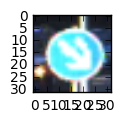

In [5]:
import random
import numpy as np
index = random.randint(0, len(X_train))
image = X_train[index].squeeze()

plt.figure(figsize=(1,1))
plt.imshow(image)
print(y_train[index],  signnames[y_train[index]])

/home/seyfi/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


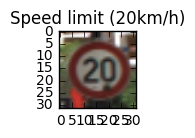

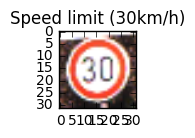

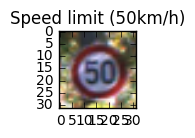

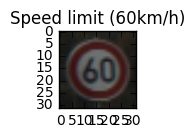

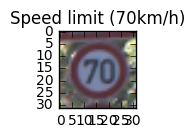

...

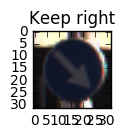

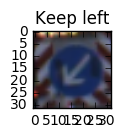

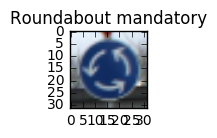

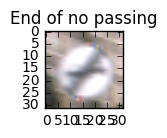

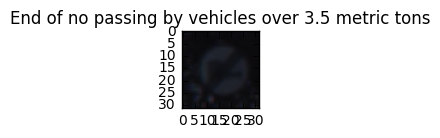

In [6]:
def show_samples_all_classes():
    for i in range(n_classes):
        img = X_train[y_train == i][200]
        plt.figure(figsize=(1,1))
        plt.title(signnames[i])
        plt.imshow(img)
        # print(i, signnames[i])
show_samples_all_classes()        

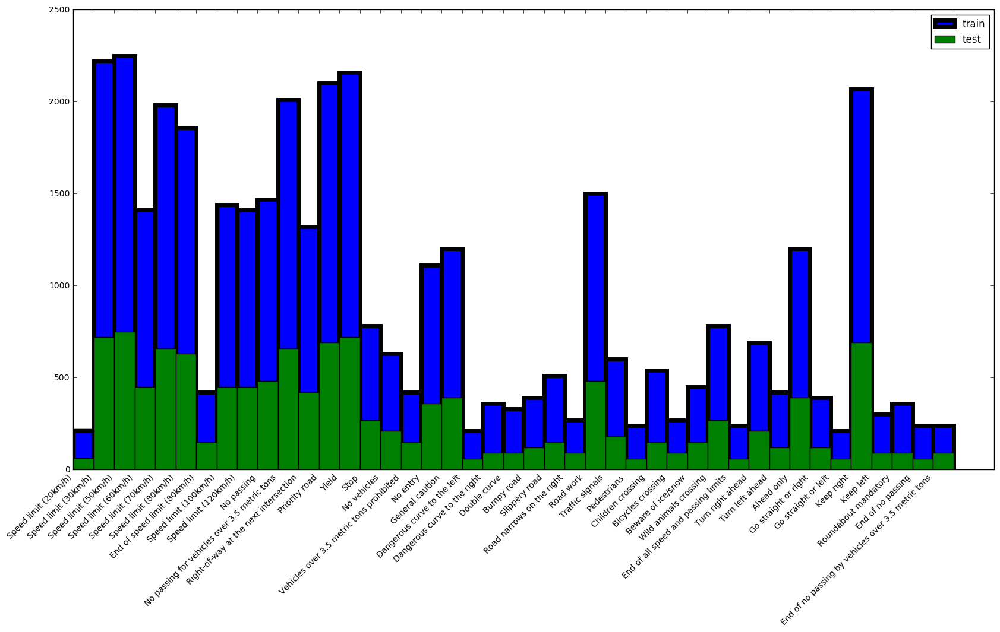

In [7]:
signlist = [value for value in signnames.values()]
plt.figure(figsize=(20,10))
bins = [i for i in range(n_classes + 1)]
ax = plt.subplot()
counts_train, bins_train, patches_train = ax.hist(y_train,bins=bins,label='train')
counts_test, bins_test, patches_test = ax.hist(y_test, facecolor='green',bins=bins,label='test')
ax.set_xticks(bins_train)
ax.set_xticklabels(signlist, rotation=45, ha="right")
plt.setp(patches_train, linewidth=5)
plt.legend()
plt.show()

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [8]:
### Preprocess the data here.
### Feel free to use as many code cells as needed.
from sklearn.utils import shuffle
# Normalize inputs

X_train, y_train = shuffle(X_train, y_train)
X_train = (X_train.astype('float32') - 128) / 128
X_test = (X_test.astype('float32') - 128) / 128
X_train_all = X_train
y_train_all = y_train


### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**
* Shuffled the training data, in order to prevent training bias
* Normalize training and test data

In [9]:
### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.
from datetime import datetime
t0 = datetime.now()
fold_num = 5
fold_size = int(np.ceil(n_train / fold_num))
cross_folds = []
for i in range(fold_num):
    pre_index = i * fold_size
    fold_index = (i + 1) * fold_size
    if fold_index > n_train:
        fold_index = n_train
    fold = {}
    train_indices = [i for i in range(0,pre_index)] +\
                    [i for i in range(fold_index,n_train)]
    # print(len(train_indices), fold_index - pre_index)
    fold['X_train'] = X_train[train_indices,:,:,:]
    fold['X_valid'] = X_train[pre_index:fold_index,:,:,:]
    fold['y_train'] = y_train[train_indices]
    fold['y_valid'] = y_train[pre_index:fold_index]
    cross_folds.append(fold)
print(datetime.now() - t0)    
for fold in cross_folds:
    print(len(fold['X_train']),
          len(fold['y_train']),
          len(fold['X_valid']),
          len(fold['y_valid']))

0:00:00.394556
31367 31367 7842 7842
31367 31367 7842 7842
31367 31367 7842 7842
31367 31367 7842 7842
31368 31368 7841 7841


### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**
* In order to apply cross fold validation, training data splitted in to 5 parts

In [10]:
### Define your architecture here.
### Feel free to use as many code cells as needed.
import tensorflow as tf
from tensorflow.contrib.layers import flatten

In [11]:
class ConvPool:
    def __init__(self, shape, name, mu=0, sigma=0.1):
        Wname = 'w_' + name
        bname = 'b_' + name
        self.W = tf.Variable(tf.truncated_normal(shape=shape, mean=mu,stddev=sigma),name=Wname)
        self.b = tf.Variable(tf.zeros(shape[3]),name=bname)
        
    def forward(self, x, strides=[1,1,1,1], padding='VALID',
                poolsize=[1,2,2,1], poolstrides=[1,2,2,1],
                poolpadding='VALID'):
        self.conv = tf.nn.conv2d(x, self.W, strides=strides, padding=padding)
        self.conv = tf.nn.bias_add(self.conv, self.b)
        self.conv_out = tf.nn.relu(self.conv)
        self.pool = tf.nn.max_pool(self.conv_out, ksize=poolsize, strides=poolstrides, padding=poolpadding)
        return self.pool

In [12]:
class FullyCon:
    def __init__(self, shape, name, layer='hidden', mu=0, sigma=0.1):
        Wname = 'w_' + name
        bname = 'b_' + name
        self.W = tf.Variable(tf.truncated_normal(shape=shape, mean=mu, stddev=sigma),name=Wname)
        self.b = tf.zeros(shape[1],name=bname)
        self.layer = layer
            
    def forward(self, x, dropout=1.0):
        self.z = tf.add(tf.matmul(x,self.W),self.b)
        if self.layer == 'hidden':
            self.out = tf.nn.relu(self.z)
            self.out = tf.nn.dropout(self.out, dropout)           
        else:
            self.out = self.z
        return self.out        

In [13]:
class LeNet:
    def __init__(self, shapes=[(5,5,3,6),(5,5,6,16),(400,120)]):
        self.mu = 0
        self.sigma = 0.1
        self.cps = []
        self.fcs = []
        self.cps.append(ConvPool(shape=shapes[0],name='cp_0'))
        self.cps.append(ConvPool(shape=shapes[1],name='cp_1'))
        self.fcs.append(FullyCon(shape=shapes[2],name='fc_0'))
        self.fcs.append(FullyCon(shape=(120,84),name='fc_1'))
        self.ol = FullyCon(shape=(84,n_classes),layer='output',name='out')
        
    def forward(self, x, dropout=1.0):
        out = x
        for cp in self.cps:
            out = cp.forward(out)
        out = flatten(out)
        for fc in self.fcs:
            out = fc.forward(out, dropout)
        logits = self.ol.forward(out)
        return logits

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**
* 2 classes defined for layers, one for convolution and pooling layer, and one for fully connected layer. LeNet class consists of layers of these two types.
* The architecture consists of two convolution and pooling layers and three fully connected layers. The last fully connected layer is the output layer.
* Convolution layers has a filter of size 5x5, the depth of the first layer is 6 and the depth of the second layer is 16.
* Pool layers has a size of 2x2 and a stride as 2.

In [14]:
### Train your model here.
### Feel free to use as many code cells as needed.
x = tf.placeholder(tf.float32, (None,32,32,3))
y = tf.placeholder(tf.int32,(None))
yoh = tf.one_hot(y, n_classes)
keep_prob = tf.placeholder(tf.float32)
keep_def = tf.constant(1.0, dtype=tf.float32)

lr_list = [0.002, 0.001, 0.0005]
epoch_list = [10]
# epoch_list = [10, 15, 20]
batch_size_list = [128]
# batch_size_list = [64, 128, 256]
dropout_list = [1.0, 0.8, 0.6]
shape_list = [[(3,3,3,6), (4,4,6,16), (576,120)],
             [(5,5,3,6), (5,5,6,16), (400,120)],
             [(7,7,3,6), (6,6,6,16), (256,120)]]

In [15]:
class CNN:
    def __init__(self, lr, batch_size, dropout, shapes):
        self.batch_size = batch_size
        self.LeNet = LeNet(shapes=shapes)
        self.dropout = dropout
        
        logits = self.LeNet.forward(x, self.dropout)
        cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, yoh)
        loss_operation = tf.reduce_mean(cross_entropy)
        optimizer = tf.train.AdamOptimizer(learning_rate=lr)
        self.training_operation = optimizer.minimize(loss_operation)         
        logits_val = self.LeNet.forward(x, keep_def)
        
        self.predict = tf.argmax(logits_val,1)
        self.topn = tf.nn.top_k(tf.nn.softmax(logits_val), k=5)
        
        correct_prediction = tf.equal(tf.argmax(logits_val,1), tf.argmax(yoh,1))
        self.accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
        self.saver = tf.train.Saver()

    def evaluate(self, X_data, y_data):
        BATCH_SIZE = self.batch_size
        num_examples = len(X_data)
        total_accuracy = 0
        sees = tf.get_default_session()
        for offset in range(0, num_examples, BATCH_SIZE):
            batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
            accuracy = sess.run(self.accuracy_operation, feed_dict={x: batch_x, y:batch_y})
            total_accuracy += (accuracy * len(batch_x))
        return total_accuracy / num_examples        
        

In [16]:
def cross_fold():
    accuracy_file = open('accuracy.txt', 'w')
    accuracy_file.write('lr;epochs;batch_size;dropout;shape;accuracy_mean;time\n')
    for lr in lr_list:
        for epochs in epoch_list:
            for batch_size in batch_size_list:
                for dropout in dropout_list:
                    for shape in shape_list:
                        fi = 0
                        accuracy_list = []
                        t0 = datetime.now()
                        for fold in cross_folds:
                            X_train = fold['X_train']
                            y_train = fold['y_train']
                            X_validation = fold['X_valid']
                            y_validation = fold['y_valid']
                            with tf.Session() as sess:
                                cnn = CNN(lr, batch_size, keep_prob, shape)
                                BATCH_SIZE = batch_size
                                sess.run(tf.global_variables_initializer())
                                num_examples = len(X_train)

                                for i in range(epochs):
                                    X_train, y_train = shuffle(X_train, y_train)
                                    for offset in range(0, num_examples, BATCH_SIZE):
                                        end = offset + BATCH_SIZE
                                        batch_x, batch_y = X_train[offset:end], y_train[offset:end]
                                        sess.run(cnn.training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob:dropout})

                                    #validation_accuracy = cnn.evaluate(X_validation, y_validation)
                                    #print(fi, "EPOCH {} ...".format(i+1), str(datetime.now() - t0), "Validation Accuracy = {:.3f}".format(validation_accuracy))

                                validation_accuracy = cnn.evaluate(X_validation, y_validation)
                                accuracy_list.append(validation_accuracy)
                            fi += 1

                        accuracy_mean = (np.array(accuracy_list)).mean()
                        duration = datetime.now() - t0
                        print(lr, epochs, batch_size, dropout, shape, accuracy_mean,duration)
                        accuracy_file.write('%f;%d;%d;%f;%s;%f;%s\n' %(
                                            lr, epochs, batch_size, dropout, shape, accuracy_mean,str(duration)))
    accuracy_file.close()


In [17]:
# Takes considerable time, results are in the following cell
#cross_fold()

In [19]:
lr = 0.002
EPOCHS = 10
BATCH_SIZE = 128
dropout = 0.8
shape = shape_list[1]
X_train = X_train_all
y_train = y_train_all
t0 = datetime.now()
savefile = './lenet.ckpt'

In [17]:

with tf.Session() as sess:
    cnn = CNN(lr, BATCH_SIZE, keep_prob, shape)
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train)

    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(cnn.training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob:dropout})

        train_accuracy = cnn.evaluate(X_train, y_train)
        print("EPOCH {} ...".format(i+1), str(datetime.now() - t0), "Train Accuracy = {:.3f}".format(train_accuracy))

    cnn.saver.save(sess, savefile)
    print("Model saved")

EPOCH 1 ... 0:00:13.506727 Train Accuracy = 0.916
EPOCH 2 ... 0:00:24.771851 Train Accuracy = 0.965
EPOCH 3 ... 0:00:35.976705 Train Accuracy = 0.972
EPOCH 4 ... 0:00:47.216810 Train Accuracy = 0.987
EPOCH 5 ... 0:00:58.426258 Train Accuracy = 0.988
EPOCH 6 ... 0:01:09.632042 Train Accuracy = 0.990
EPOCH 7 ... 0:01:20.764074 Train Accuracy = 0.994
EPOCH 8 ... 0:01:32.035144 Train Accuracy = 0.993
EPOCH 9 ... 0:01:43.201992 Train Accuracy = 0.993
EPOCH 10 ... 0:01:54.320207 Train Accuracy = 0.994
Model saved


In [20]:
tf.reset_default_graph()
x = tf.placeholder(tf.float32, (None,32,32,3))
y = tf.placeholder(tf.int32,(None))
yoh = tf.one_hot(y, n_classes)
keep_prob = tf.placeholder(tf.float32)
keep_def = tf.constant(1.0, dtype=tf.float32)
cnn = CNN(lr, BATCH_SIZE, keep_prob, shape)
sess = tf.Session()
#with tf.Session() as sess:    

cnn.saver.restore(sess, savefile)

test_accuracy = cnn.evaluate(X_test, y_test)
print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 0.944


### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

5 fold cross validation performed to choose hyperparameters.
* From learning rate values, 0.002 performs better than 0.001 and 0.0005
* 0.8 dropout rate performs better than 1.0 and 0.6
* filters with 5x5 shape performed better than the other 2 shaped that have been tried.

Because of time limitations, different hyperparameter alternatives were not tried.

The model trained with all training data with the selected parameters.

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

LeNet architecture applied to find a solution. In order to choose hyperparameters, 5 fold cross validation applied.
Selected hyperparameters are;
 * learning_rate = 0.002
 * dropout = 0.8
 * convolution layer shapes = (5, 5, 3, 6), (5, 5, 6, 16)
The average accuracy for the validation set is 0.984544180135


In addition, CNN without pooling applied with the selected hyperparameters.
There are 7 convolution layers with shapes:
        * (5,5,3,6)
        * (5,5,6,10)
        * (5,5,10,14)
        * (5,5,14,18)
        * (5,5,18,22)
        * (5,5,22,26)
        * (4,4,26,30)
And 3 fully connected layers with shapes:
        * (750,400)
        * (400,120)
        * (120,84)
The average accuracy for the validation set is 0.978933584386.
The same model is trained with a dropout value of 0.9, the average accuracy became 0.981611495481.


The performance of the model may be improved; however, because of the time limitations the LeNet architecture is selected to train since it has the highest average accuracy.




---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

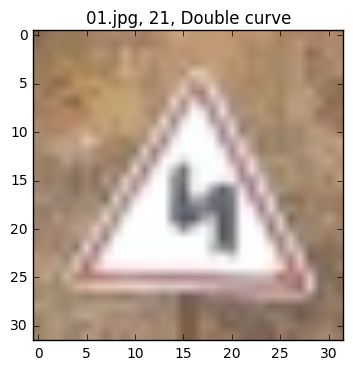

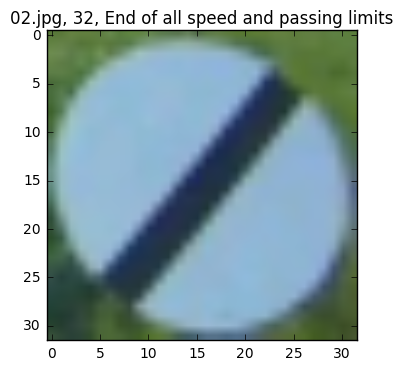

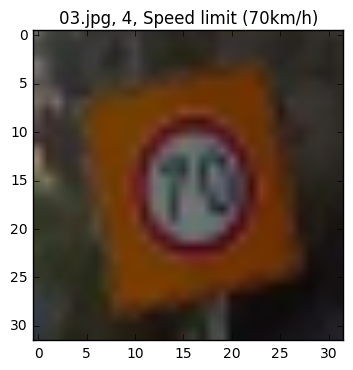

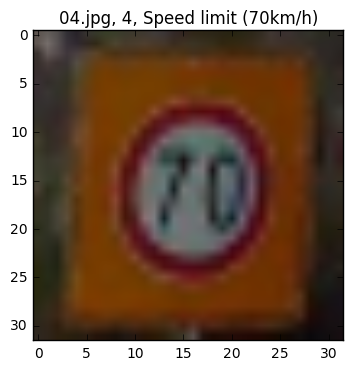

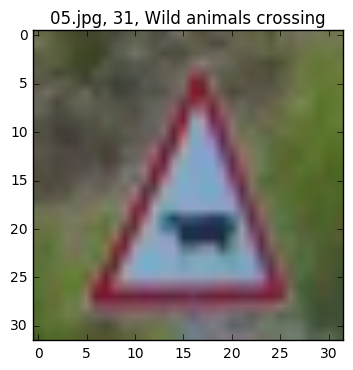

...

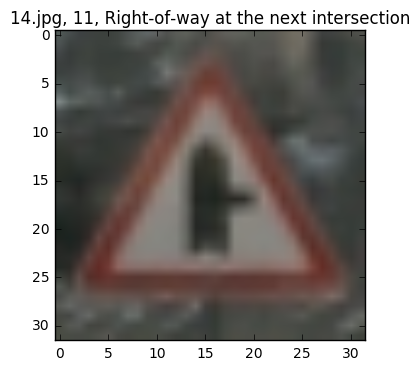

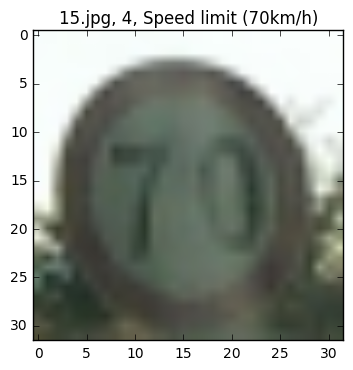

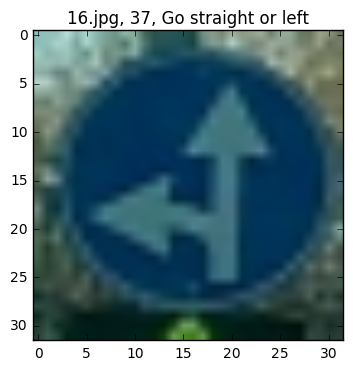

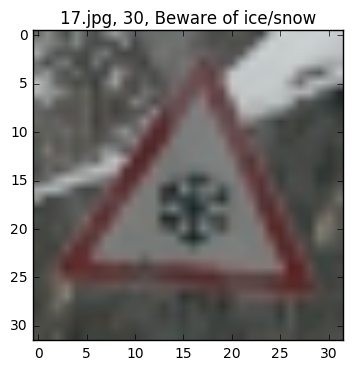

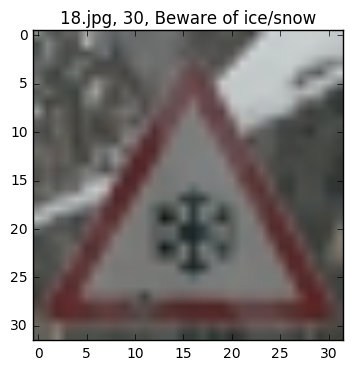

In [21]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.
import matplotlib.image as mpimg
import os
folder = 'newimages'

fnewimages = open(os.path.join(folder, 'labels.txt'))
new_labels = {}
for line in fnewimages:
    sample_id, class_id = line.split(',')
    new_labels[sample_id] = int(class_id)

image_file_list = os.listdir(folder)
image_list = []
image_filen_list = []
image_label_list = []
for img_file in image_file_list:
    if img_file.endswith('jpg'):
        img = mpimg.imread(os.path.join(folder, img_file))
        image_list.append(img)
        image_filen_list.append(img_file)
        label = new_labels[os.path.splitext(img_file)[0]]
        image_label_list.append(label)
        plt.figure()
        image_title = '%s, %d, %s' % (img_file, label, signnames[label])
        plt.title(image_title)
        plt.imshow(img)

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

Some of the new images are difficult to classify with the trained model. Rotation, blur, stain, angle and the position of the object are the reasons for this situation. Some of the new images are rotated, and some of them are streched if the camera angle is too narrow.
    

In [22]:
### Run the predictions here.
### Feel free to use as many code cells as needed.
X_images = np.array(image_list)
X_images = X_images.astype('float32')
X_images = X_images - 128
X_images = X_images / 128
y_images = np.zeros((len(image_list)))

# with tf.Session() as sess:
    # sess.run(cnn.predict, feed_dict={x: x_images, y: y_images, keep_prob:keep_def})
output = sess.run(cnn.predict, feed_dict={x: X_images})
correct = 0
for i in range(len(image_list)):
    #plt.figure()
    #img = image_list[i]
    out = output[i]
    #plt.imshow(img)
    image_file = image_filen_list[i]
    label = image_label_list[i]
    if label == out:
        correct += 1
    print(image_file, 'prediction: ', out, signnames[out], 'correct: ', label, signnames[label])
print('accuracy: %.4f' %(float(correct) / len(image_list)), correct, 'out of', len(image_list))
    #for out in output:


01.jpg prediction:  21 Double curve correct:  21 Double curve
02.jpg prediction:  32 End of all speed and passing limits correct:  32 End of all speed and passing limits
03.jpg prediction:  0 Speed limit (20km/h) correct:  4 Speed limit (70km/h)
04.jpg prediction:  4 Speed limit (70km/h) correct:  4 Speed limit (70km/h)
05.jpg prediction:  11 Right-of-way at the next intersection correct:  31 Wild animals crossing
06.jpg prediction:  13 Yield correct:  13 Yield
07.jpg prediction:  2 Speed limit (50km/h) correct:  2 Speed limit (50km/h)
08.jpg prediction:  9 No passing correct:  9 No passing
09.jpg prediction:  9 No passing correct:  9 No passing
10.jpg prediction:  3 Speed limit (60km/h) correct:  1 Speed limit (30km/h)
11.jpg prediction:  16 Vehicles over 3.5 metric tons prohibited correct:  16 Vehicles over 3.5 metric tons prohibited
12.jpg prediction:  22 Bumpy road correct:  22 Bumpy road
13.jpg prediction:  13 Yield correct:  2 Speed limit (50km/h)
14.jpg prediction:  11 Right-of-

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**

The model does not perform well on captured pictures. The accuracy on the new images is 77.78% and the accuracy on the test data set is 94.40%. The reasons for the lower performance on the captured images are rotation, blur, stain, angle and the position of the object as mentioned in the answer of Question 6. In addition overfitting seems to be a major problem for the model. Some examples for misclassifications are listed below. The images 03.jpg and the 04.jpg are the same pictures only the 04.jpg is rotated. Model can recognize 04.jpg but can not recognize 03.jpg. The position of the traffic sign affects the prediction. 13.jpg predicted as yield however, it is a speed limit.

In [23]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
topn = sess.run(cnn.topn, feed_dict={x: X_images})

0. Picture correct label: 21 - Double curve
    1. 21 - Double curve: 99.73%
    2. 11 - Right-of-way at the next intersection: 0.20%
    3. 40 - Roundabout mandatory: 0.06%
    4. 33 - Turn right ahead: 0.01%
    5. 2 - Speed limit (50km/h): 0.00%
1. Picture correct label: 32 - End of all speed and passing limits
    1. 32 - End of all speed and passing limits: 100.00%
    2. 6 - End of speed limit (80km/h): 0.00%
    3. 41 - End of no passing: 0.00%
    4. 42 - End of no passing by vehicles over 3.5 metric tons: 0.00%
    5. 3 - Speed limit (60km/h): 0.00%
2. Picture correct label: 4 - Speed limit (70km/h)
    1. 0 - Speed limit (20km/h): 76.27%
    2. 4 - Speed limit (70km/h): 9.94%
    3. 5 - Speed limit (80km/h): 5.59%
    4. 8 - Speed limit (120km/h): 4.69%
    5. 3 - Speed limit (60km/h): 1.35%
3. Picture correct label: 4 - Speed limit (70km/h)
    1. 4 - Speed limit (70km/h): 100.00%
    2. 1 - Speed limit (30km/h): 0.00%
    3. 0 - Speed limit (20km/h): 0.00%
    4. 2 - Speed 

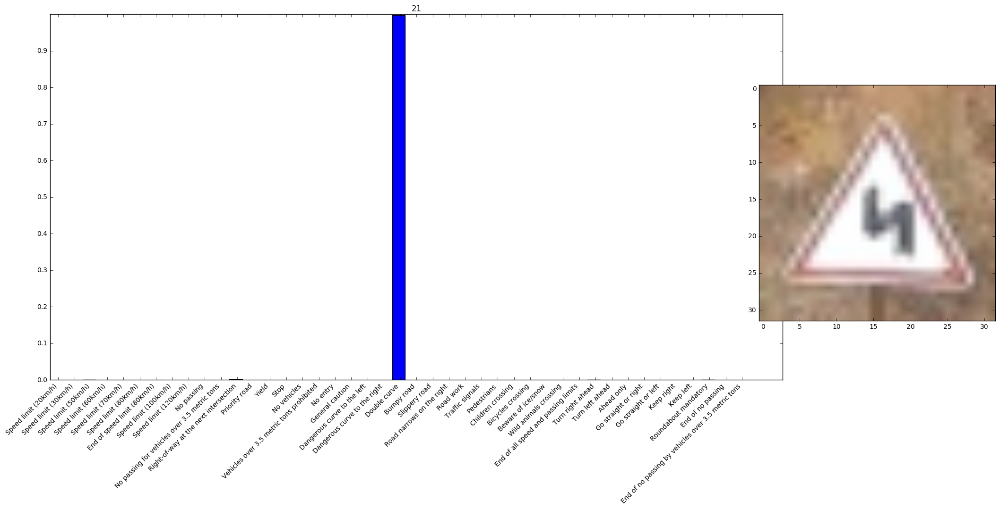

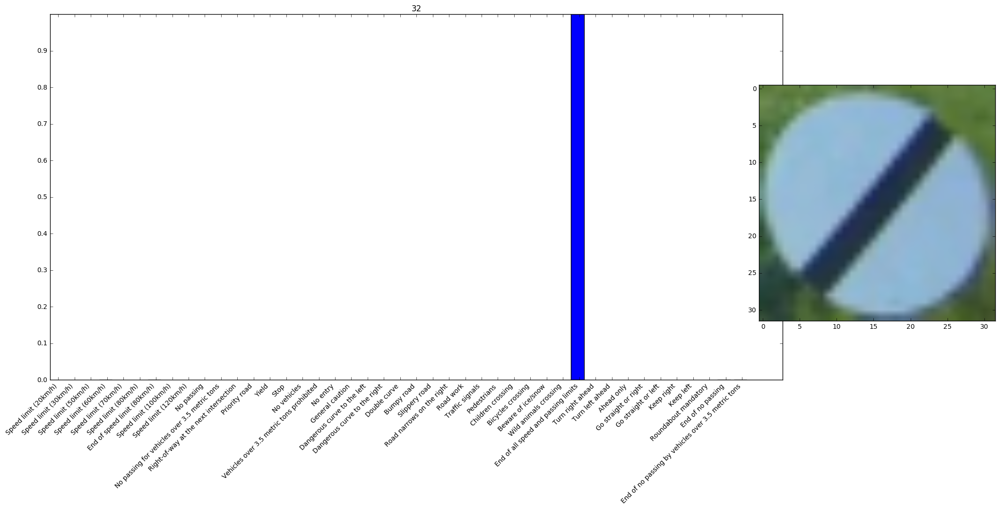

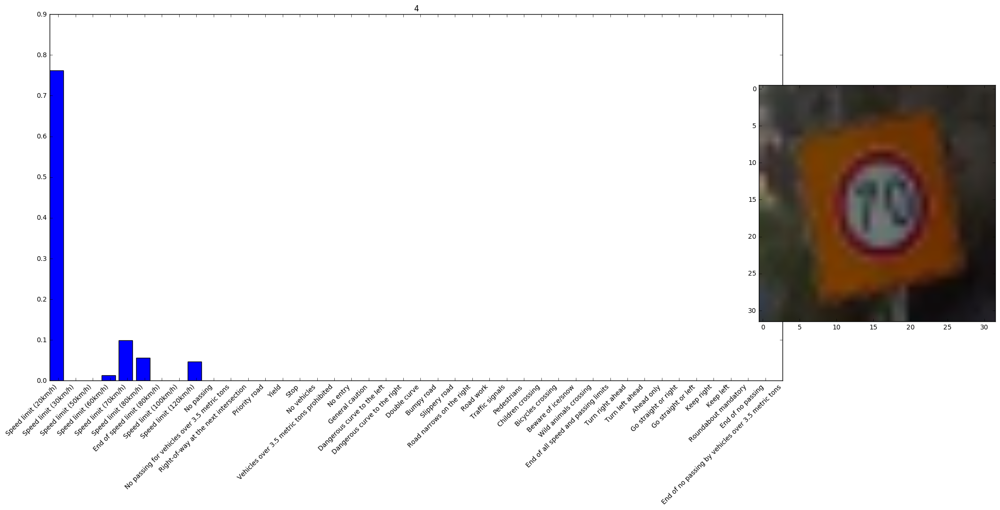

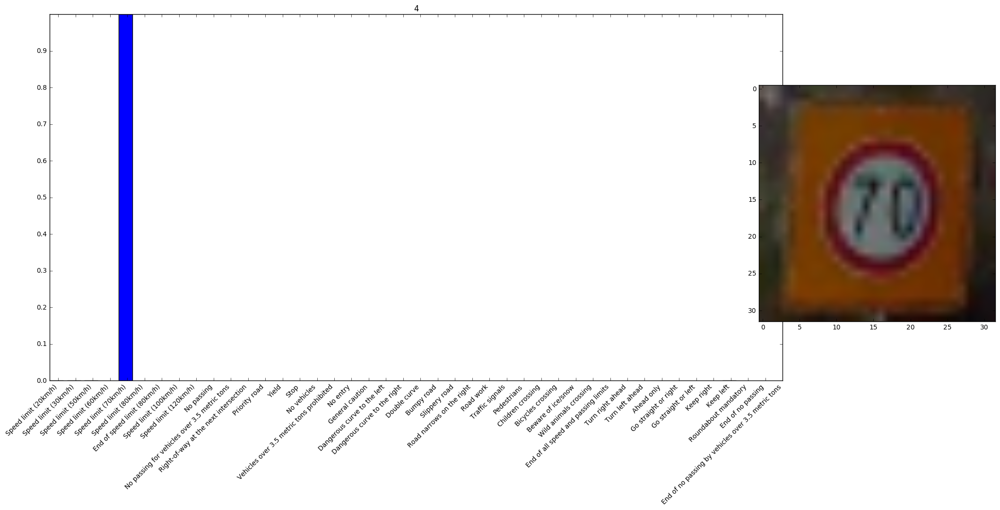

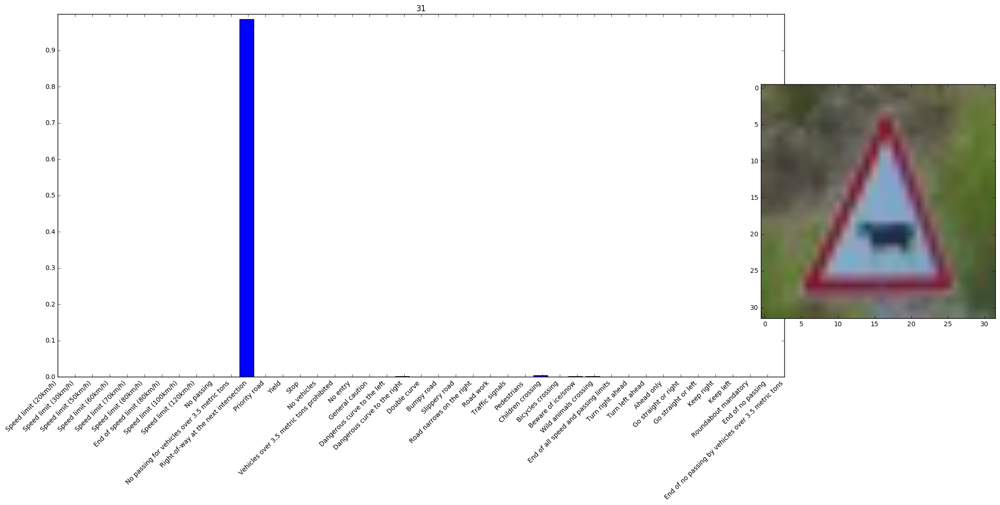

...

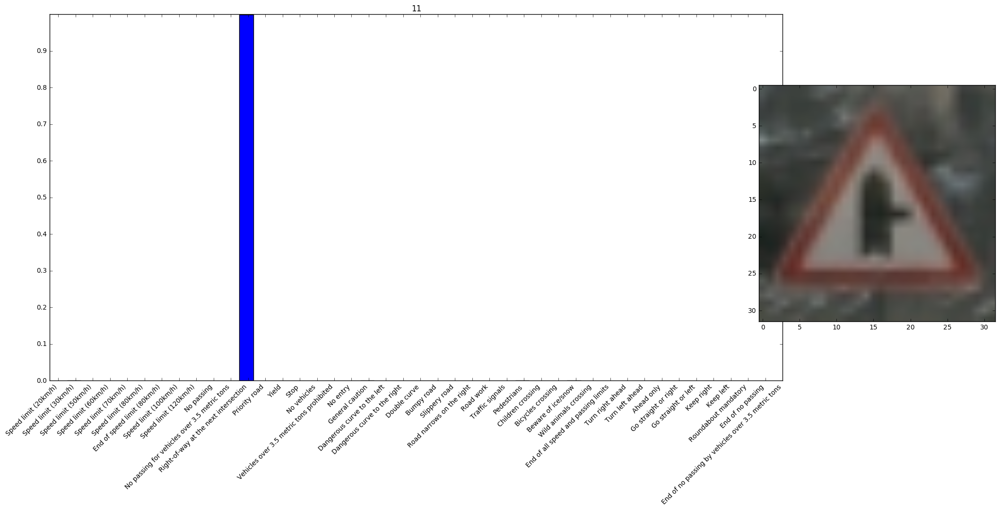

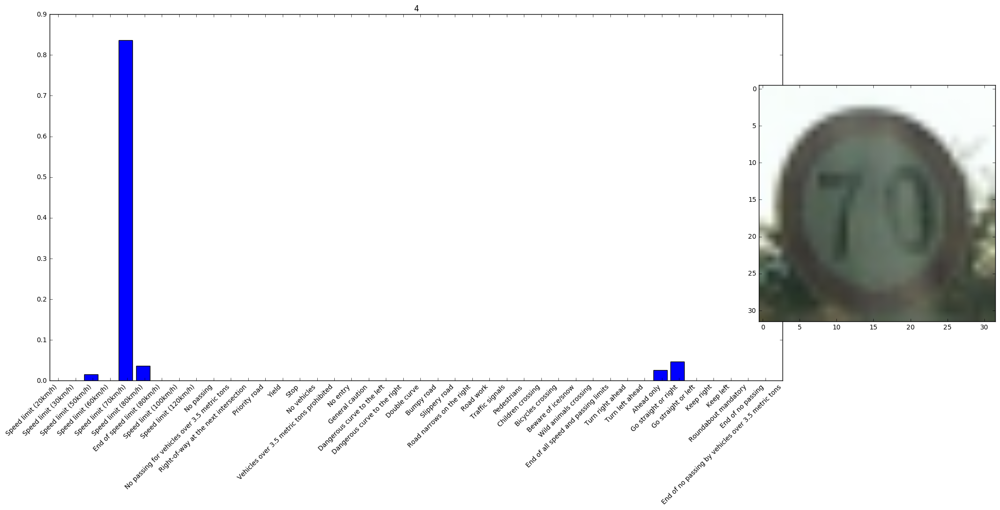

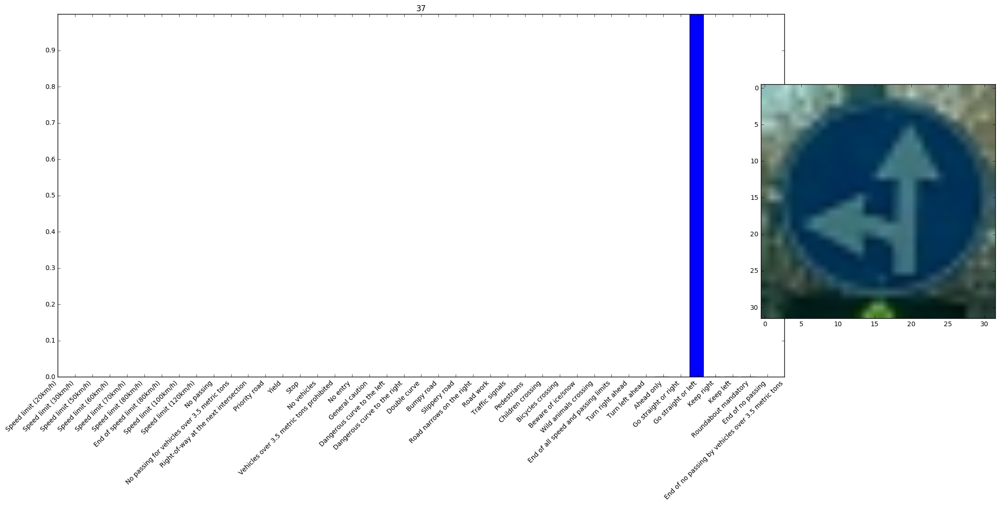

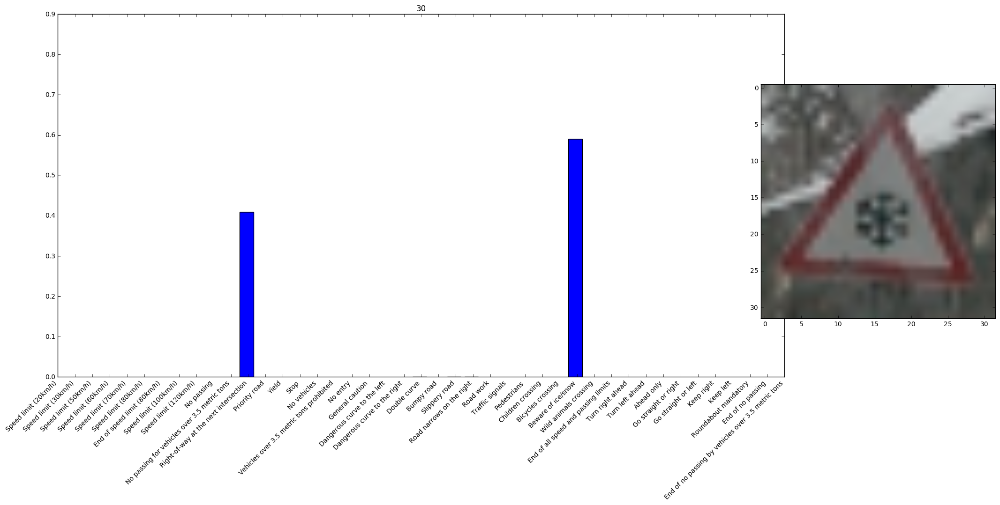

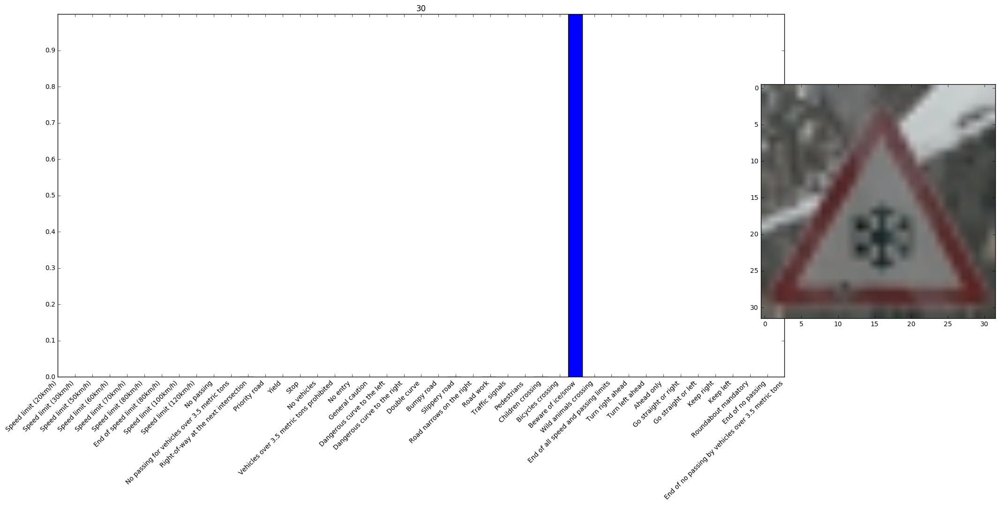

In [27]:
#topn.indices
certain_level = 99.5
certain = [0] * 2
correct_predictions = [0] * 5
for i in range(len(image_label_list)):
    top = topn.indices[i]
    label = image_label_list[i]
    print('%d. Picture correct label: %d - %s' %(i, label, signnames[label]))
    for j in range(5):
        val = topn.values[i,j] * 100
        if val > certain_level:
            if top[j] == label:
                certain[0] += 1
            else:
                certain[1] += 1
        if top[j] == label:
            correct_predictions[j] += 1
        print('    %d. %d - %s: %.2f%%' %(j + 1,top[j], signnames[top[j]], val))
    plt.figure(figsize=(20, 10))
    bins = [i for i in range(n_classes + 1)]
    plt.bar(top, topn.values[i,:])
    plt.title(label)
    plt.xticks(np.arange(0.5, 43.5, 1.0), signlist, ha='right', rotation=45)
    plt.yticks(np.arange(0.0, 1.0, 0.1), np.arange(0.0, 1.0, 0.1))
    ax = plt.axes([0.75, 0.25, 0.5, 0.5], frameon=True)
    ax.imshow(image_list[i])
    ax.axis=('off')
    
print('Number of correct predictions in 1, 2, 3, 4, 5:', correct_predictions)
print('Number of predictions that all wrong in top-5:', len(image_label_list) - sum(correct_predictions))
print('Number of certain predictions: Correct, False', certain)

plt.show()

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**

For 11 pictures the model is certain (predicts with a probability greater than or equal to 99.5%). 10 of them are correct and 1 of them is wrong. For the 2 pictures, the correct label does not occur in top 5 predictions.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.